In [1]:
import datetime
import warnings

import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import pearsonr
from TA_strats import *

%matplotlib inline
%load_ext autoreload
%autoreload 2

pd.core.common.is_list_like = pd.api.types.is_list_like
pd.options.display.max_rows = 99999
pd.options.display.max_columns = 99999
warnings.filterwarnings('ignore', category=FutureWarning)

/var/folders/1_/mbzt5h8d5qnf8rr2f1nvq0wm0000gp/T/ipykernel_3322/1270482427.py:5: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
initial_capital=10000
start_date = datetime.datetime(2020, 1, 1)
end_date = datetime.datetime(2024, 4, 15)
initial_window = datetime.timedelta(days=365)
roll_period = datetime.timedelta(days=30)
strategies = {
    'AROON_Xcross': {'func': strategy_AROON_Xcross, 'params': {'n': 35}, 'backtest_params': {'sl': -2, 'tp': 18}},
    'AROON_Ycross': {'func': strategy_AROON_Ycross, 'params': {'n': 50, 'livello': 50}, 'backtest_params': {'sl': -2, 'tp': 16}},
    'OBV': {'func': strategy_OBV, 'params': {'n': 50}, 'backtest_params': {'sl': -1, 'tp': 20}},
    'Stocastico': {'func': strategy_Stocastico, 'params': {'k': 14}, 'backtest_params': {'sl': -3, 'tp': 18}},
    'PSAR': {'func': strategy_PSAR, 'params': {}, 'backtest_params': {'sl': 1, 'tp': 17}},
    'KAMA': {'func': strategy_KAMA, 'params': {'n': 30, 'f': 3, 'l': 30}, 'backtest_params': {'sl': -2, 'tp': 17}},
}
backtest_results = rolling_window_backtest('ETH-USD', start_date, end_date, initial_window, roll_period, strategies, run_backtest, initial_capital)

[*********************100%***********************]  1 of 1 completed


# Optimized Parameters

AaronX = {
    'sl': 2,
    'tp': 18,
    'n': 35
}
----------
AaronY = {
    'sl': 2,
    'tp': 16,
    'n': 50,
    'livello': 50
}
----------
OBV = {
    'sl': 1,
    'tp': 20,
    'n': 50
}
----------
Oscillatore Stocastico = {
    'sl': 3,
    'tp': 18,
    'k': 14
}
----------
KAMA = {
    'sl': 2,
    'tp': 17,
    'n': 30,
    'f': 3,
    'l': 30
}
----------
KAMA2 = {
    'sl': 2,
    'tp': 17,
    'n': 50,
    'f': 5,
    'l': 25
}
----------
Parabolic SAR = {
    'sl': 1,
    'tp': 17
}

# Report

In [3]:
detailed_reports = []
rit_cum_data = []

for strategy_name, reports in backtest_results.items():
    for roll_index, report_data in enumerate(reports, start=1):
        report_info = report_data['report']
        report_info['Strategy'] = strategy_name
        report_info['Roll'] = f'Roll {roll_index}'
        detailed_reports.append(report_info)
        rit_cum_info = {
            'Strategy': strategy_name,
            'Roll': f'Roll {roll_index}',
            'RIT_CUM': report_data.get('RIT_CUM')
        }
        rit_cum_data.append(rit_cum_info)

df_report = pd.DataFrame(detailed_reports)
df_rit_cum = pd.DataFrame(rit_cum_data)
df_report = df_report[['Strategy', 'Roll'] + [col for col in df_report.columns if col not in ['Strategy', 'Roll']]]

In [4]:
df_report

,Strategy,Roll,Ritorno Ann,Volatilità Ann,Profitto,Profitto Buy&Hold,Operazioni Chiuse,Operazioni Long,Operazioni Short,Rendimento Medio,Rendimento Medio %,Dev. Std Rend. Med,Profit Factor,Profitto Lordo,Perdita Lorda,% Trade Vincenti,% Trade Perdenti,Reward Risk Ratio,Guadagno Massimo,Guadagno Massimo Data,Guadagno Medio,Guadagno % Medio,Dev. Std Guadagni,Perdita Massima,Perdita Massima Data,Perdita Media,Perdita % Media,Dev. Std Perdite,Avg Draw Down,Max Draw Down,Max Draw Down %,Sharpe Ratio,Sharpe Ratio B&H,VaR Historic,CVaR Historic,Sortino Ratio,Calmar Ratio,Burke Ratio,Modified Burke Ratio
0,AROON_Xcross,Roll 1,48.13,24.65,4797.0,47891.0,8,4,4,600.0,6.01,11.09,4.410000e+00,6203.0,-1405.0,37.50,62.50,7.36,2314.0,2020-07-26,2068.0,19.32,2.28,-302.0,2020-09-06,-281.0,-1.98,0.02,-536.0,-994.0,-8.0,1.95,5.02,-0.00,0.05,1.81,6.02,0.94,18.03
1,AROON_Xcross,Roll 2,48.13,24.65,4797.0,65085.0,8,4,4,600.0,6.01,11.09,4.410000e+00,6203.0,-1405.0,37.50,62.50,7.36,2314.0,2020-07-26,2068.0,19.32,2.28,-302.0,2020-09-06,-281.0,-1.98,0.02,-545.0,-994.0,-8.0,1.95,6.48,-0.00,0.05,1.81,6.02,0.87,16.64
2,AROON_Xcross,Roll 3,25.81,17.14,2573.0,54474.0,7,4,3,368.0,3.73,9.75,3.140000e+00,3775.0,-1202.0,28.57,71.43,7.85,1984.0,2020-07-26,1888.0,18.00,0.00,-262.0,2020-09-06,-240.0,-1.98,0.02,-475.0,-848.0,-8.0,1.51,5.27,-0.00,0.05,0.97,3.23,0.43,8.23
3,AROON_Xcross,Roll 4,5.79,13.38,577.0,128928.0,7,4,4,63.0,0.88,7.55,1.370000e+00,1653.0,-1209.0,14.29,85.71,8.21,1653.0,2020-07-26,1653.0,18.00,NaN,-221.0,2020-09-06,-201.0,-1.97,0.02,-422.0,-669.0,-6.0,0.43,14.35,-0.00,0.05,0.19,0.96,0.09,1.69
4,AROON_Xcross,Roll 5,25.58,15.44,2550.0,117527.0,6,3,3,425.0,4.69,10.31,4.050000e+00,3385.0,-835.0,33.33,66.67,8.11,1748.0,2020-07-26,1693.0,18.00,0.00,-228.0,2020-09-06,-209.0,-1.97,0.02,-409.0,-669.0,-6.0,1.66,13.94,-0.00,0.04,0.73,4.26,0.46,8.80
5,AROON_Xcross,Roll 6,23.13,15.57,2306.0,92298.0,7,3,4,329.0,3.74,9.74,3.140000e+00,3385.0,-1079.0,28.57,71.43,7.84,1748.0,2020-07-26,1693.0,18.00,0.00,-244.0,2021-05-20,-216.0,-1.97,0.02,-402.0,-669.0,-6.0,1.49,8.24,-0.00,0.04,0.73,3.85,0.41,7.91
6,AROON_Xcross,Roll 7,8.70,13.11,867.0,82155.0,5,2,3,173.0,2.02,8.93,2.130000e+00,1638.0,-770.0,20.00,80.00,8.51,1638.0,2021-04-02,1638.0,18.00,NaN,-195.0,2021-05-20,-193.0,-1.97,0.02,-344.0,-669.0,-7.0,0.66,7.66,-0.00,0.04,0.21,1.24,0.15,2.90
7,AROON_Xcross,Roll 8,17.35,13.86,1730.0,62496.0,5,3,3,173.0,2.02,8.93,2.130000e+00,1638.0,-770.0,20.00,80.00,8.51,1638.0,2021-04-02,1638.0,18.00,NaN,-195.0,2021-05-20,-193.0,-1.97,0.02,-329.0,-669.0,-7.0,1.25,5.79,-0.00,0.04,0.41,2.48,0.30,5.72
8,AROON_Xcross,Roll 9,29.83,14.40,2973.0,75131.0,5,3,2,595.0,6.02,10.94,6.160000e+00,3549.0,-576.0,40.00,60.00,9.25,1912.0,2021-07-31,1775.0,18.00,0.00,-195.0,2021-05-20,-192.0,-1.97,0.02,-229.0,-669.0,-7.0,2.07,6.76,-0.00,0.03,0.64,4.26,0.77,14.69
9,AROON_Xcross,Roll 10,29.38,14.12,2929.0,76201.0,5,2,3,586.0,6.02,10.93,5.720000e+00,3549.0,-620.0,40.00,60.00,8.58,1912.0,2021-07-31,1775.0,18.00,0.00,-238.0,2021-09-21,-207.0,-1.96,0.00,-286.0,-669.0,-6.0,2.08,7.06,-0.00,0.03,0.64,4.90,0.96,18.37


In [5]:
df_rit_cum.head()

,Strategy,Roll,RIT_CUM
0,AROON_Xcross,Roll 1,Date 2020-01-01 10000.000000 2020-01-02 ...
1,AROON_Xcross,Roll 2,Date 2020-01-31 10000.000000 2020-02-01 ...
2,AROON_Xcross,Roll 3,Date 2020-03-01 10000.000000 2020-03-02 ...
3,AROON_Xcross,Roll 4,Date 2020-03-31 10000.000000 2020-04-01 ...
4,AROON_Xcross,Roll 5,Date 2020-04-30 10000.000000 2020-05-01 ...


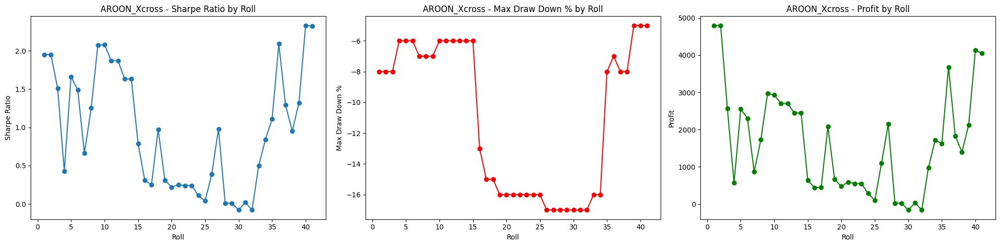

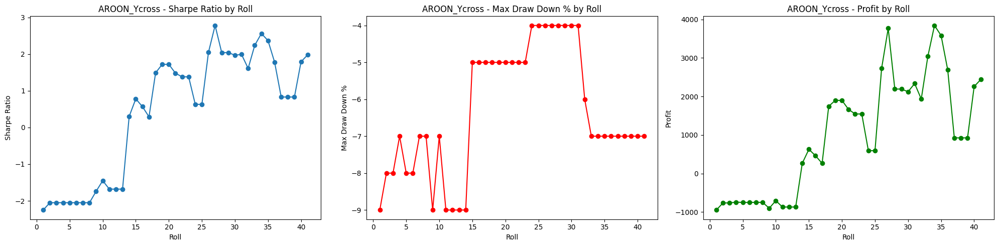

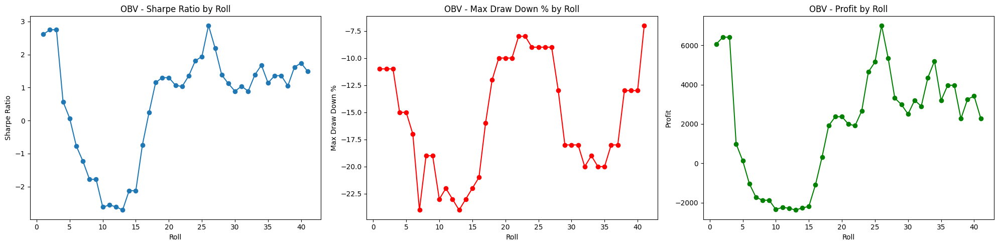

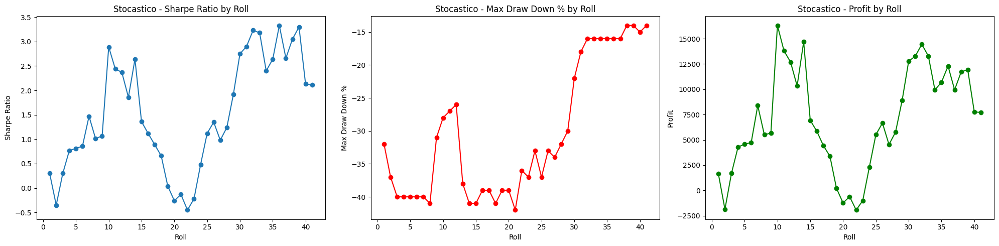

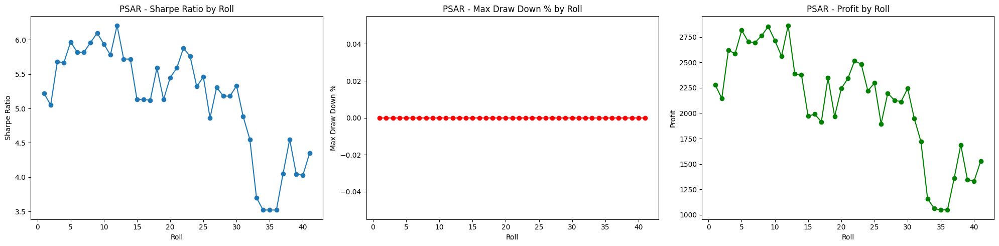

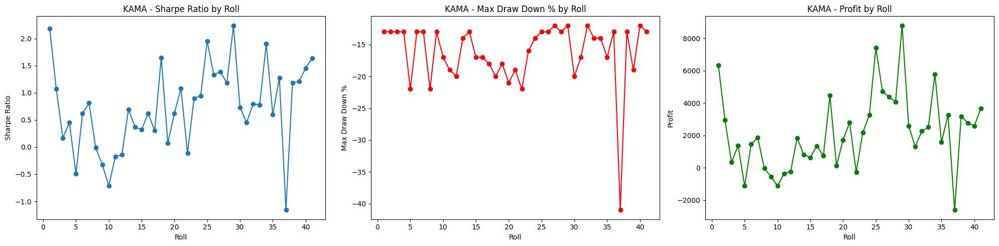

In [6]:
strategies = df_report['Strategy'].unique()

for strategy in strategies:
    fig, ax = plt.subplots(1, 3, figsize=(20, 5))
    data = df_report[df_report['Strategy'] == strategy]
    roll_numbers = data['Roll'].str.extract('(\d+)')[0].astype(int)
    ax[0].plot(roll_numbers, data['Sharpe Ratio'], marker='o', linestyle='-')
    ax[0].set_title(f'{strategy} - Sharpe Ratio by Roll')
    ax[0].set_xlabel('Roll')
    ax[0].set_ylabel('Sharpe Ratio')
    ax[1].plot(roll_numbers, data['Max Draw Down %'], marker='o', linestyle='-', color='red')
    ax[1].set_title(f'{strategy} - Max Draw Down % by Roll')
    ax[1].set_xlabel('Roll')
    ax[1].set_ylabel('Max Draw Down %')
    ax[2].plot(roll_numbers, data['Profitto'], marker='o', linestyle='-', color='green')
    ax[2].set_title(f'{strategy} - Profit by Roll')
    ax[2].set_xlabel('Roll')
    ax[2].set_ylabel('Profit')
    plt.tight_layout()
    plt.show()

In [7]:
df_average_stats = df_report.groupby('Strategy').agg({col: 'mean' for col in df_report.select_dtypes(include=[np.number]).columns})

df_average_stats

,Ritorno Ann,Volatilità Ann,Profitto,Profitto Buy&Hold,Operazioni Chiuse,Operazioni Long,Operazioni Short,Rendimento Medio,Rendimento Medio %,Dev. Std Rend. Med,Profit Factor,Profitto Lordo,Perdita Lorda,% Trade Vincenti,% Trade Perdenti,Reward Risk Ratio,Guadagno Massimo,Guadagno Medio,Guadagno % Medio,Dev. Std Guadagni,Perdita Massima,Perdita Media,Perdita % Media,Dev. Std Perdite,Avg Draw Down,Max Draw Down,Max Draw Down %,Sharpe Ratio,Sharpe Ratio B&H,VaR Historic,CVaR Historic,Sortino Ratio,Calmar Ratio,Burke Ratio,Modified Burke Ratio
Strategy,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AROON_Xcross,16.587073,18.294634,1653.682927,25371.341463,7.780488,3.902439,4.000000,216.975610,2.580000,9.050244,2.470732e+00,2794.951220,-1208.780488,21.662927,78.337073,8.435854,1730.829268,1666.585366,19.269756,1.472857,-221.609756,-198.707317,-1.977073,0.019512,-506.365854,-1237.121951,-11.000000,0.970244,2.630732,0.524390,1.359268,0.630244,2.319756,0.315122,6.032683
AROON_Ycross,9.930732,9.196585,990.048780,25371.341463,4.756098,2.365854,2.487805,190.097561,2.621463,6.798780,3.047561e+00,1593.853659,-659.048780,25.121707,74.878293,6.882857,926.609756,1297.214286,16.992500,2.752105,-203.219512,-187.829268,-1.978293,0.019268,-398.073171,-672.560976,-6.341463,0.420244,2.630732,0.054878,0.267073,0.498293,2.072439,0.261463,4.996585
KAMA,21.795854,25.965122,2172.390244,25371.341463,21.243902,10.926829,10.853659,105.000000,1.281463,7.137805,1.710488e+00,5263.560976,-3222.243902,16.700244,83.299756,8.228293,1761.341463,1505.536585,16.943171,2.448974,-239.585366,-184.195122,-1.840488,0.250976,-874.121951,-1917.365854,-16.292683,0.727805,2.630732,1.739512,2.791707,0.833902,1.612927,0.263902,5.033171
OBV,19.869268,19.983659,1980.024390,25371.341463,23.682927,12.804878,13.024390,100.536585,1.095610,5.294390,2.156098e+00,3427.731707,-1989.878049,12.179268,87.820732,13.172258,1548.951220,1375.677419,15.580000,9.822857,-118.439024,-97.097561,-0.991951,0.012195,-1054.951220,-1881.975610,-15.560976,0.539024,2.630732,0.989268,1.924878,0.825366,1.879512,0.265366,5.064146
PSAR,21.152195,4.043171,2108.756098,25371.341463,30.048780,14.780488,15.268293,69.780488,0.698293,0.440976,2.108756e+11,2108.756098,0.000000,69.513902,30.486098,inf,114.780488,100.097561,1.004146,0.009512,0.000000,NaN,NaN,NaN,NaN,0.000000,0.000000,5.141220,2.630732,0.000000,0.000000,NaN,0.000000,0.000000,0.000000
Stocastico,70.503415,48.380488,7023.317073,25371.341463,63.121951,33.853659,33.780488,98.243902,1.169756,7.464878,1.453902e+00,21106.024390,-15224.365854,28.427073,71.572927,3.721220,2681.975610,1241.878049,11.978049,7.368049,-547.195122,-330.951220,-2.691220,0.560976,-2051.926829,-4902.243902,-30.390244,1.517561,2.630732,3.271707,4.500244,2.846341,3.191951,0.406585,7.760244


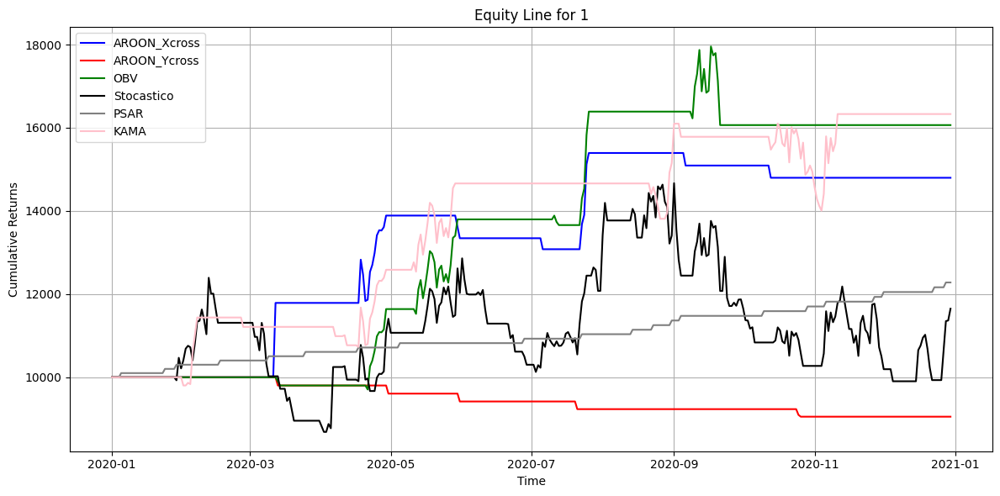

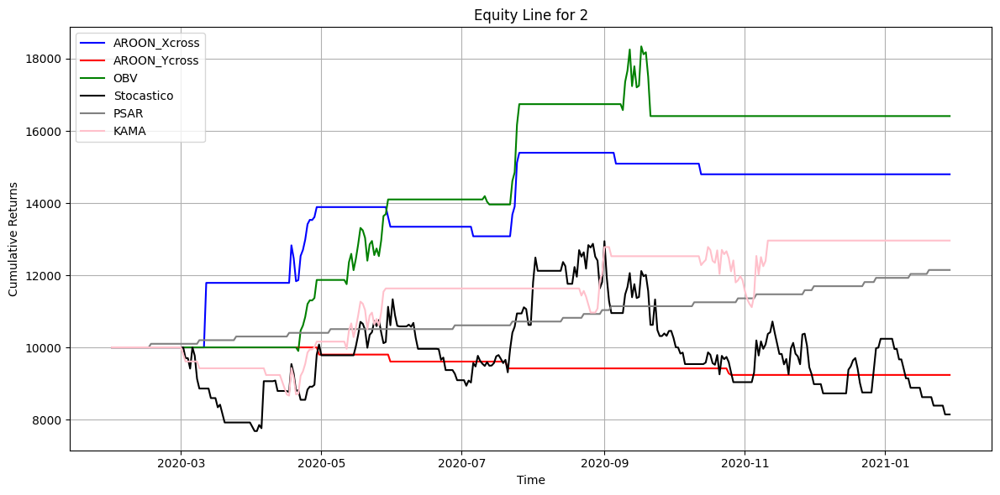

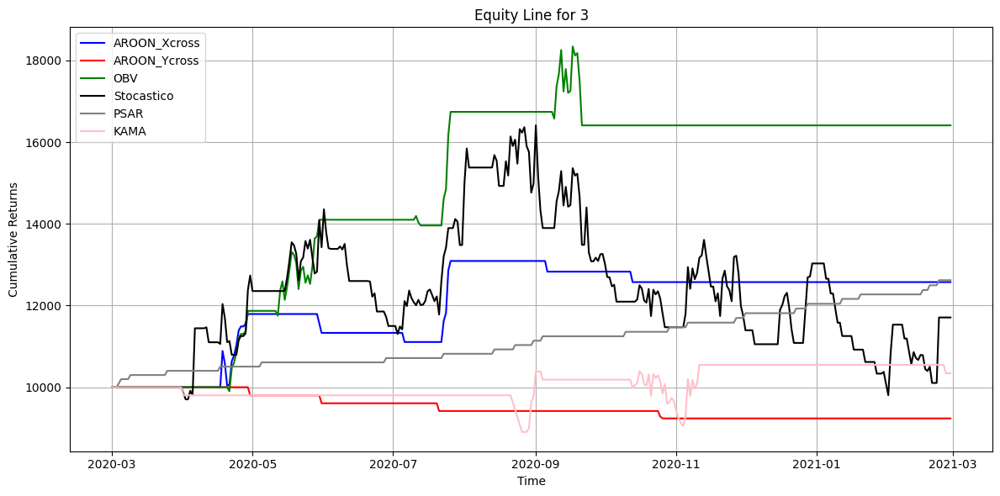

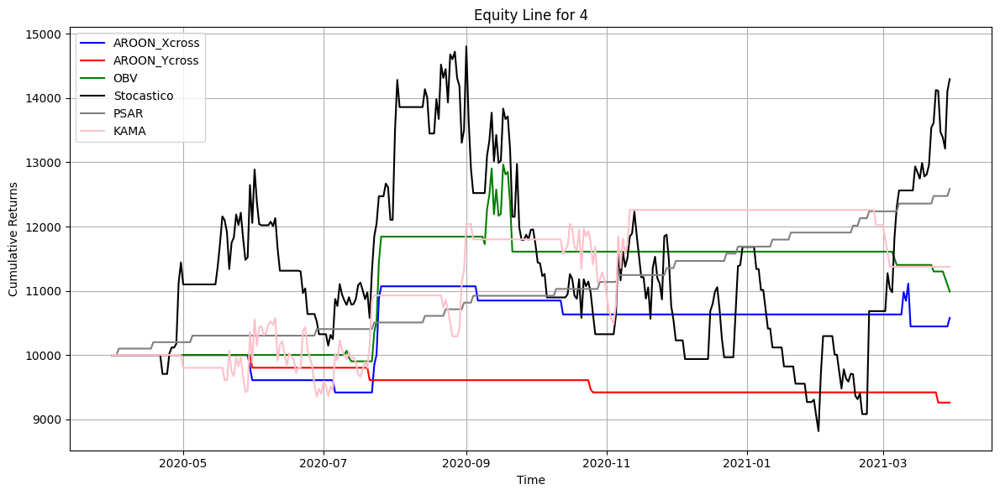

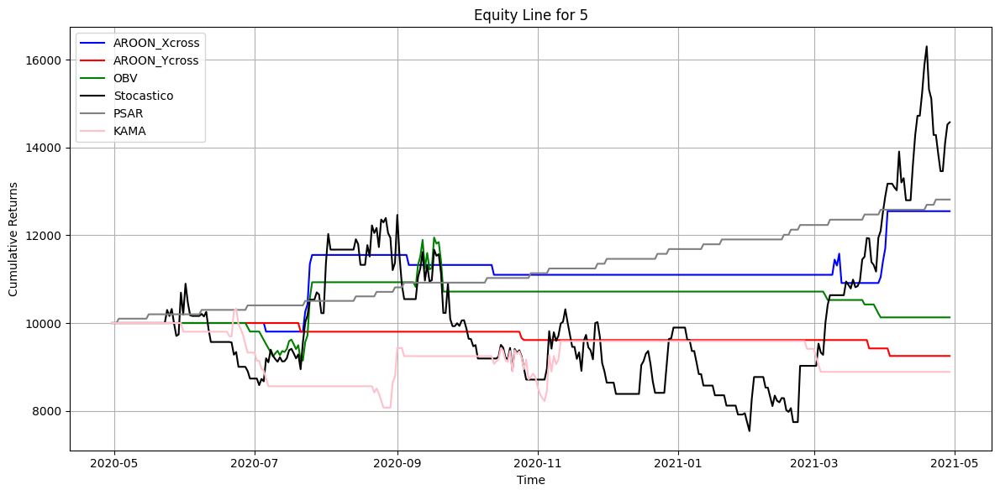

...

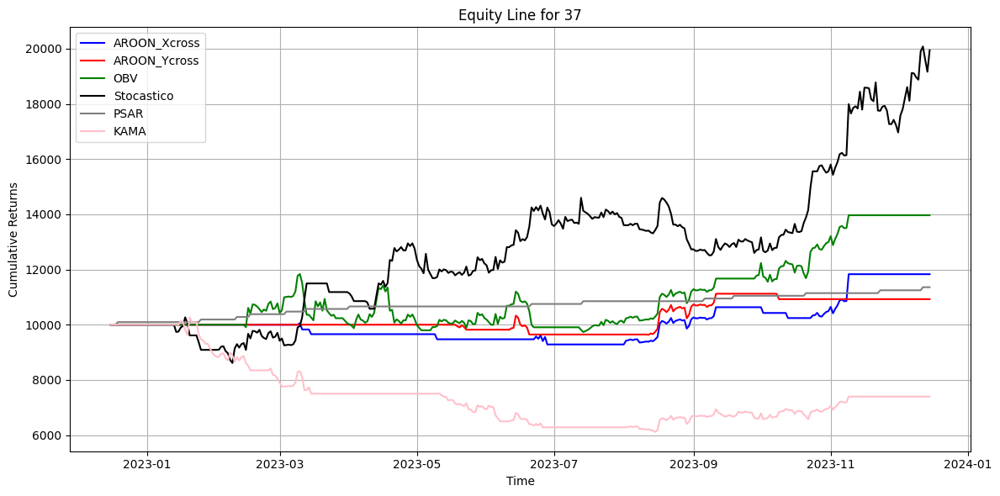

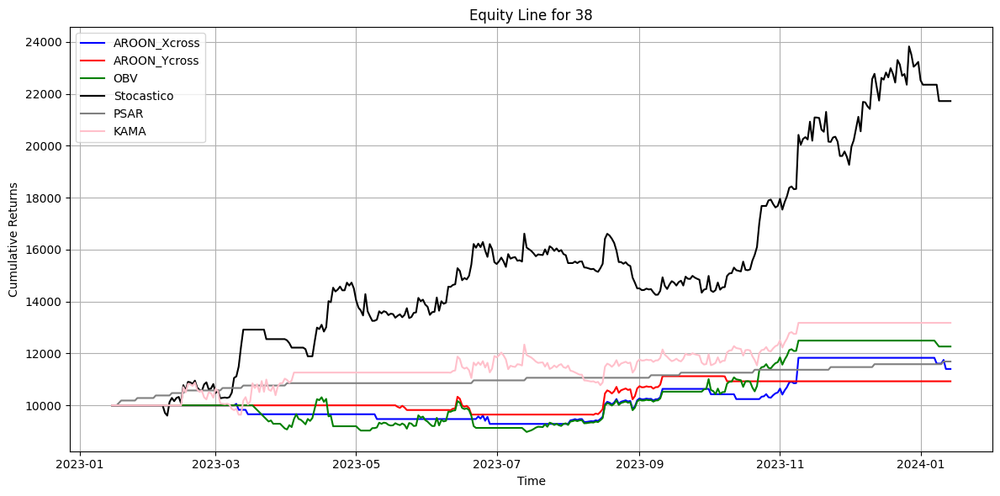

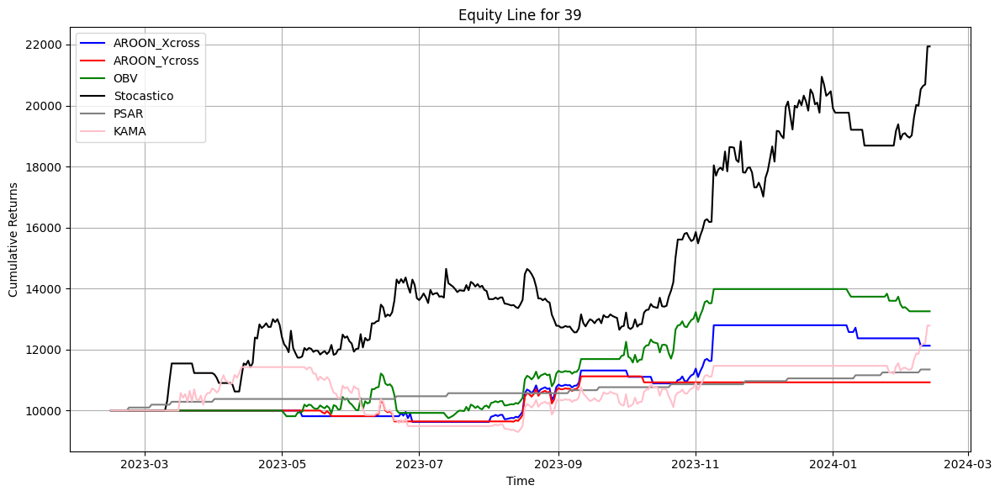

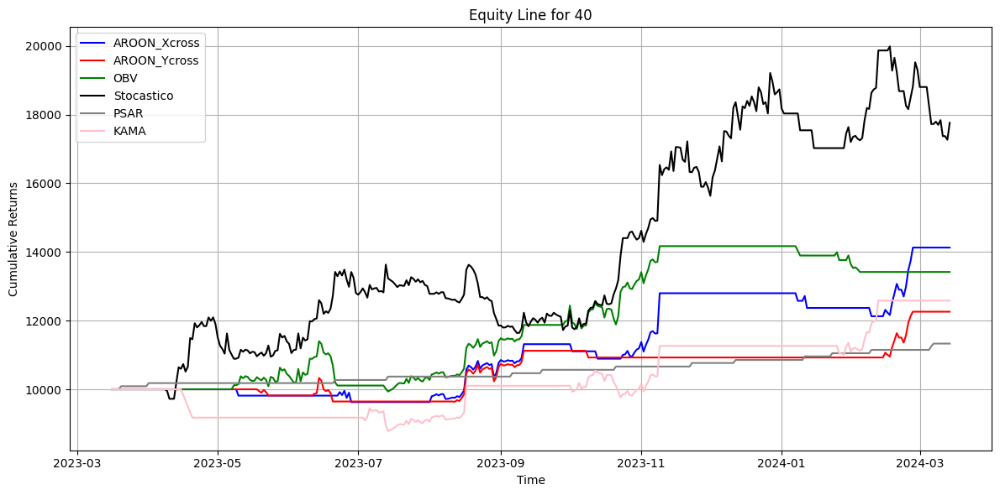

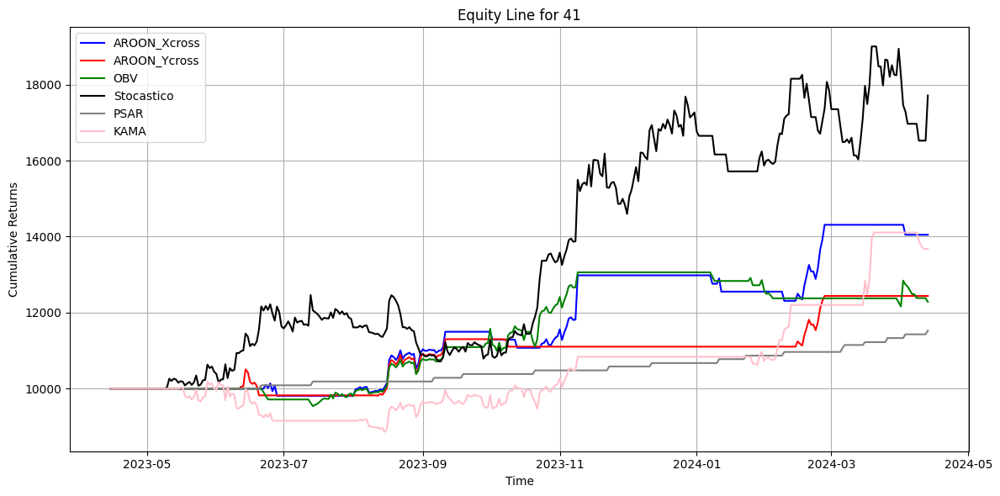

In [8]:
colors = ['blue', 'red', 'green', 'black', 'gray', 'pink']
unique_rolls = df_rit_cum['Roll'].unique()
n_rolls = len(unique_rolls)
strategies = {
    'AROON_Xcross': {'func': strategy_AROON_Xcross, 'params': {'n': 35}, 'backtest_params': {'sl': -2, 'tp': 18}},
    'AROON_Ycross': {'func': strategy_AROON_Ycross, 'params': {'n': 50, 'livello': 50}, 'backtest_params': {'sl': -2, 'tp': 16}},
    'OBV': {'func': strategy_OBV, 'params': {'n': 50}, 'backtest_params': {'sl': -1, 'tp': 20}},
    'Stocastico': {'func': strategy_Stocastico, 'params': {'k': 14}, 'backtest_params': {'sl': -3, 'tp': 18}},
    'PSAR': {'func': strategy_PSAR, 'params': {}, 'backtest_params': {'sl': 1, 'tp': 17}},
    'KAMA': {'func': strategy_KAMA, 'params': {'n': 30, 'f': 3, 'l': 30}, 'backtest_params': {'sl': -2, 'tp': 17}},
}

for roll in unique_rolls:
    roll_number = int(roll.split()[1])
    plot_equity_by_roll(df_rit_cum, roll_number, strategies, colors)

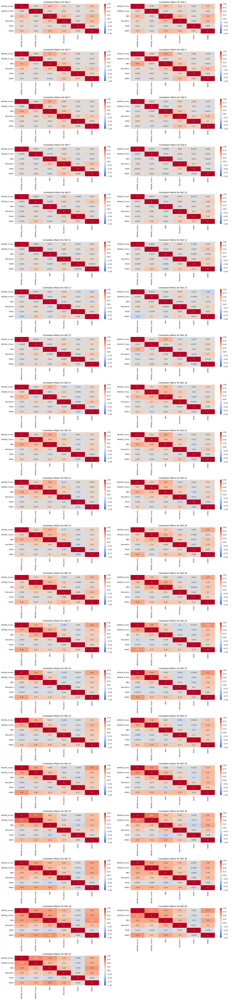

In [9]:
fig, axes = plt.subplots(nrows=(n_rolls + 1) // 2, ncols=2, figsize=(20, 4 * ((n_rolls + 1) // 2)))
if n_rolls % 2 != 0:
    axes[-1, -1].axis('off')
    
for idx, roll in enumerate(unique_rolls):
    ax = axes[idx // 2, idx % 2]
    roll_data = df_rit_cum[df_rit_cum['Roll'] == roll]
    daily_returns = pd.DataFrame()
    for _, row in roll_data.iterrows():
        equity_series = row['RIT_CUM']
        daily_return = equity_series.pct_change().dropna()
        daily_returns[row['Strategy']] = daily_return
    correlation_matrix = daily_returns.corr()
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, ax=ax)
    ax.set_title(f'Correlation Matrix for {roll}')
plt.tight_layout()
plt.show()

In [10]:
for roll in unique_rolls:
    roll_data = df_rit_cum[df_rit_cum['Roll'] == roll]
    daily_returns = pd.DataFrame()
    for _, row in roll_data.iterrows():
        equity_series = row['RIT_CUM']
        daily_return = equity_series.pct_change().dropna()
        daily_returns[row['Strategy']] = daily_return
    p_values = pd.DataFrame(index=daily_returns.columns, columns=daily_returns.columns, dtype=float)
    for col1 in daily_returns.columns:
        for col2 in daily_returns.columns:
            if col1 != col2:
                _, p_val = pearsonr(daily_returns[col1].dropna(), daily_returns[col2].dropna())
                p_values.loc[col1, col2] = p_val
            else:
                p_values.loc[col1, col2] = np.nan
    significant_p_values = p_values[p_values > 0.05]
    print(f"Significant P-values (under 0.05) for correlations in {roll}:")
    display(significant_p_values.dropna(axis=0, how='all').dropna(axis=1, how='all'))

Significant P-values (under 0.05) for correlations in Roll 1:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,0.352901,NaN,NaN,0.703124,NaN
AROON_Ycross,0.352901,NaN,0.519240,0.228109,0.563673,0.428968
OBV,NaN,0.519240,NaN,NaN,0.740912,NaN
Stocastico,NaN,0.228109,NaN,NaN,0.325478,NaN
PSAR,0.703124,0.563673,0.740912,0.325478,NaN,0.273449
KAMA,NaN,0.428968,NaN,NaN,0.273449,NaN


Significant P-values (under 0.05) for correlations in Roll 2:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,0.314637,NaN,NaN,0.674807,NaN
AROON_Ycross,0.314637,NaN,0.804864,0.189392,0.612418,0.438945
OBV,NaN,0.804864,NaN,NaN,0.726978,NaN
Stocastico,NaN,0.189392,NaN,NaN,0.287401,NaN
PSAR,0.674807,0.612418,0.726978,0.287401,NaN,0.280823
KAMA,NaN,0.438945,NaN,NaN,0.280823,NaN


Significant P-values (under 0.05) for correlations in Roll 3:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,0.186847,NaN,NaN,0.470209,0.845959
AROON_Ycross,0.186847,NaN,0.804864,0.183882,0.576738,0.366713
OBV,NaN,0.804864,NaN,NaN,0.829307,0.975320
Stocastico,NaN,0.183882,NaN,NaN,NaN,NaN
PSAR,0.470209,0.576738,0.829307,NaN,NaN,0.143587
KAMA,0.845959,0.366713,0.975320,NaN,0.143587,NaN


Significant P-values (under 0.05) for correlations in Roll 4:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,0.107812,NaN,0.388468,0.103769,0.465367
AROON_Ycross,0.107812,NaN,0.944584,NaN,0.575485,0.319791
OBV,NaN,0.944584,NaN,NaN,0.610324,0.971619
Stocastico,0.388468,NaN,NaN,NaN,NaN,NaN
PSAR,0.103769,0.575485,0.610324,NaN,NaN,0.275365
KAMA,0.465367,0.319791,0.971619,NaN,0.275365,NaN


Significant P-values (under 0.05) for correlations in Roll 5:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,0.864151,NaN,0.091949,0.294525,0.651105
AROON_Ycross,0.864151,NaN,NaN,0.268113,0.559565,0.442277
OBV,NaN,NaN,NaN,NaN,0.716419,0.694492
Stocastico,0.091949,0.268113,NaN,NaN,NaN,NaN
PSAR,0.294525,0.559565,0.716419,NaN,NaN,0.107057
KAMA,0.651105,0.442277,0.694492,NaN,0.107057,NaN


Significant P-values (under 0.05) for correlations in Roll 6:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,0.876157,0.841182,0.083747,0.262800,0.820029
AROON_Ycross,0.876157,NaN,0.934676,0.258361,0.567747,0.445745
OBV,0.841182,0.934676,NaN,NaN,0.746756,0.978494
Stocastico,0.083747,0.258361,NaN,NaN,NaN,NaN
PSAR,0.262800,0.567747,0.746756,NaN,NaN,NaN
KAMA,0.820029,0.445745,0.978494,NaN,NaN,NaN


Significant P-values (under 0.05) for correlations in Roll 7:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,0.938234,0.924448,0.271469,0.834558,0.693894
AROON_Ycross,0.938234,NaN,0.887350,0.615970,0.566920,0.357293
OBV,0.924448,0.887350,NaN,NaN,0.695911,0.954476
Stocastico,0.271469,0.615970,NaN,NaN,NaN,NaN
PSAR,0.834558,0.566920,0.695911,NaN,NaN,0.093546
KAMA,0.693894,0.357293,0.954476,NaN,0.093546,NaN


Significant P-values (under 0.05) for correlations in Roll 8:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,0.892418,0.958132,0.129554,0.962507,0.599654
AROON_Ycross,0.892418,NaN,0.831866,0.625064,0.558880,0.299515
OBV,0.958132,0.831866,NaN,0.827212,0.675522,0.993738
Stocastico,0.129554,0.625064,0.827212,NaN,NaN,0.462087
PSAR,0.962507,0.558880,0.675522,NaN,NaN,0.909003
KAMA,0.599654,0.299515,0.993738,0.462087,0.909003,NaN


Significant P-values (under 0.05) for correlations in Roll 9:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,0.859860,0.981042,0.213125,0.866981,0.582688
AROON_Ycross,0.859860,NaN,0.857284,0.080432,0.613743,NaN
OBV,0.981042,0.857284,NaN,0.825932,0.667413,0.979873
Stocastico,0.213125,0.080432,0.825932,NaN,NaN,0.526117
PSAR,0.866981,0.613743,0.667413,NaN,NaN,0.274936
KAMA,0.582688,NaN,0.979873,0.526117,0.274936,NaN


Significant P-values (under 0.05) for correlations in Roll 10:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,0.883742,0.614647,0.404144,0.886038,0.508343
AROON_Ycross,0.883742,NaN,0.820213,0.119318,0.683511,NaN
OBV,0.614647,0.820213,NaN,0.939862,0.672321,0.758114
Stocastico,0.404144,0.119318,0.939862,NaN,NaN,NaN
PSAR,0.886038,0.683511,0.672321,NaN,NaN,NaN
KAMA,0.508343,NaN,0.758114,NaN,NaN,NaN


Significant P-values (under 0.05) for correlations in Roll 11:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,0.875701,0.641991,0.256127,0.937866,0.577667
AROON_Ycross,0.875701,NaN,0.795468,0.120269,0.639458,NaN
OBV,0.641991,0.795468,NaN,0.755089,0.925658,0.959507
Stocastico,0.256127,0.120269,0.755089,NaN,0.073527,NaN
PSAR,0.937866,0.639458,0.925658,0.073527,NaN,0.988420
KAMA,0.577667,NaN,0.959507,NaN,0.988420,NaN


Significant P-values (under 0.05) for correlations in Roll 12:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,0.875701,0.638185,0.217136,0.903158,0.455840
AROON_Ycross,0.875701,NaN,0.791057,0.094443,0.619227,NaN
OBV,0.638185,0.791057,NaN,0.696168,0.852115,0.869851
Stocastico,0.217136,0.094443,0.696168,NaN,0.108169,NaN
PSAR,0.903158,0.619227,0.852115,0.108169,NaN,NaN
KAMA,0.455840,NaN,0.869851,NaN,NaN,NaN


Significant P-values (under 0.05) for correlations in Roll 13:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,0.889680,0.658808,0.208245,0.664841,0.083243
AROON_Ycross,0.889680,NaN,0.782469,0.122441,0.640446,NaN
OBV,0.658808,0.782469,NaN,0.687373,0.880516,0.660401
Stocastico,0.208245,0.122441,0.687373,NaN,0.166295,NaN
PSAR,0.664841,0.640446,0.880516,0.166295,NaN,0.287824
KAMA,0.083243,NaN,0.660401,NaN,0.287824,NaN


Significant P-values (under 0.05) for correlations in Roll 14:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,0.978162,0.727277,0.194019,0.664775,NaN
AROON_Ycross,0.978162,NaN,0.966407,NaN,0.926523,NaN
OBV,0.727277,0.966407,NaN,0.993194,0.480791,0.760464
Stocastico,0.194019,NaN,0.993194,NaN,0.196918,0.051994
PSAR,0.664775,0.926523,0.480791,0.196918,NaN,0.161343
KAMA,NaN,NaN,0.760464,0.051994,0.161343,NaN


Significant P-values (under 0.05) for correlations in Roll 15:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,0.973128,0.427550,0.534929,0.419438,0.167563
AROON_Ycross,0.973128,NaN,0.922115,NaN,0.845150,NaN
OBV,0.427550,0.922115,NaN,0.854634,0.249614,0.584465
Stocastico,0.534929,NaN,0.854634,NaN,0.932324,NaN
PSAR,0.419438,0.845150,0.249614,0.932324,NaN,0.768760
KAMA,0.167563,NaN,0.584465,NaN,0.768760,NaN


Significant P-values (under 0.05) for correlations in Roll 16:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,0.677275,NaN,0.309235,0.658378,0.609557
AROON_Ycross,0.677275,NaN,0.722609,NaN,0.884115,0.079168
OBV,NaN,0.722609,NaN,0.620745,0.562981,0.489951
Stocastico,0.309235,NaN,0.620745,NaN,0.655018,NaN
PSAR,0.658378,0.884115,0.562981,0.655018,NaN,0.959956
KAMA,0.609557,0.079168,0.489951,NaN,0.959956,NaN


Significant P-values (under 0.05) for correlations in Roll 17:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,0.346983,NaN,0.648214,0.712830,NaN
AROON_Ycross,0.346983,NaN,0.744120,NaN,0.935026,0.635108
OBV,NaN,0.744120,NaN,0.412460,0.523463,0.076746
Stocastico,0.648214,NaN,0.412460,NaN,0.457619,NaN
PSAR,0.712830,0.935026,0.523463,0.457619,NaN,0.585440
KAMA,NaN,0.635108,0.076746,NaN,0.585440,NaN


Significant P-values (under 0.05) for correlations in Roll 18:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,NaN,NaN,0.800483,0.462788,NaN
AROON_Ycross,NaN,NaN,NaN,NaN,0.706633,0.820526
OBV,NaN,NaN,NaN,NaN,0.498390,0.096722
Stocastico,0.800483,NaN,NaN,NaN,0.974222,NaN
PSAR,0.462788,0.706633,0.498390,0.974222,NaN,0.378462
KAMA,NaN,0.820526,0.096722,NaN,0.378462,NaN


Significant P-values (under 0.05) for correlations in Roll 19:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,NaN,NaN,0.563493,0.418620,NaN
AROON_Ycross,NaN,NaN,NaN,NaN,0.689252,0.586481
OBV,NaN,NaN,NaN,NaN,0.635355,NaN
Stocastico,0.563493,NaN,NaN,NaN,0.970295,NaN
PSAR,0.418620,0.689252,0.635355,0.970295,NaN,0.899047
KAMA,NaN,0.586481,NaN,NaN,0.899047,NaN


Significant P-values (under 0.05) for correlations in Roll 20:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,NaN,NaN,0.557956,0.438789,0.230347
AROON_Ycross,NaN,NaN,NaN,NaN,0.674622,0.755285
OBV,NaN,NaN,NaN,NaN,0.630495,0.134915
Stocastico,0.557956,NaN,NaN,NaN,0.256705,NaN
PSAR,0.438789,0.674622,0.630495,0.256705,NaN,0.604357
KAMA,0.230347,0.755285,0.134915,NaN,0.604357,NaN


Significant P-values (under 0.05) for correlations in Roll 21:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,NaN,NaN,0.638666,0.487130,0.111446
AROON_Ycross,NaN,NaN,NaN,NaN,0.707278,0.303251
OBV,NaN,NaN,NaN,NaN,0.608057,0.142279
Stocastico,0.638666,NaN,NaN,NaN,0.182102,0.180839
PSAR,0.487130,0.707278,0.608057,0.182102,NaN,0.550243
KAMA,0.111446,0.303251,0.142279,0.180839,0.550243,NaN


Significant P-values (under 0.05) for correlations in Roll 22:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,NaN,NaN,0.482380,0.493969,NaN
AROON_Ycross,NaN,NaN,NaN,NaN,0.712607,0.742162
OBV,NaN,NaN,NaN,NaN,0.633210,NaN
Stocastico,0.482380,NaN,NaN,NaN,0.176529,NaN
PSAR,0.493969,0.712607,0.63321,0.176529,NaN,0.387184
KAMA,NaN,0.742162,NaN,NaN,0.387184,NaN


Significant P-values (under 0.05) for correlations in Roll 23:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,NaN,NaN,0.601106,0.490694,NaN
AROON_Ycross,NaN,NaN,NaN,NaN,0.718030,0.752299
OBV,NaN,NaN,NaN,NaN,0.603622,0.057426
Stocastico,0.601106,NaN,NaN,NaN,0.254766,NaN
PSAR,0.490694,0.718030,0.603622,0.254766,NaN,0.418149
KAMA,NaN,0.752299,0.057426,NaN,0.418149,NaN


Significant P-values (under 0.05) for correlations in Roll 24:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,NaN,NaN,0.589843,0.400303,NaN
AROON_Ycross,NaN,NaN,NaN,NaN,0.868075,0.715784
OBV,NaN,NaN,NaN,0.068622,0.890224,NaN
Stocastico,0.589843,NaN,0.068622,NaN,0.656473,NaN
PSAR,0.400303,0.868075,0.890224,0.656473,NaN,0.112080
KAMA,NaN,0.715784,NaN,NaN,0.112080,NaN


Significant P-values (under 0.05) for correlations in Roll 25:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,NaN,NaN,0.488757,0.273264,NaN
AROON_Ycross,NaN,NaN,NaN,NaN,0.865077,0.313463
OBV,NaN,NaN,NaN,0.117439,0.679351,NaN
Stocastico,0.488757,NaN,0.117439,NaN,0.092612,NaN
PSAR,0.273264,0.865077,0.679351,0.092612,NaN,NaN
KAMA,NaN,0.313463,NaN,NaN,NaN,NaN


Significant P-values (under 0.05) for correlations in Roll 26:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR
AROON_Xcross,NaN,NaN,0.124076,0.319761,0.412362
AROON_Ycross,NaN,NaN,NaN,0.086194,0.661495
OBV,0.124076,NaN,NaN,NaN,0.994549
Stocastico,0.319761,0.086194,NaN,NaN,0.758478
PSAR,0.412362,0.661495,0.994549,0.758478,NaN


Significant P-values (under 0.05) for correlations in Roll 27:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,NaN,NaN,0.233887,0.397887,NaN
AROON_Ycross,NaN,NaN,NaN,0.104946,0.541200,NaN
OBV,NaN,NaN,NaN,NaN,0.749987,NaN
Stocastico,0.233887,0.104946,NaN,NaN,0.595352,NaN
PSAR,0.397887,0.541200,0.749987,0.595352,NaN,0.113149
KAMA,NaN,NaN,NaN,NaN,0.113149,NaN


Significant P-values (under 0.05) for correlations in Roll 28:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR
AROON_Xcross,NaN,NaN,0.183470,0.057017,0.978965
AROON_Ycross,NaN,NaN,NaN,0.285850,0.640337
OBV,0.183470,NaN,NaN,0.730160,0.433533
Stocastico,0.057017,0.285850,0.730160,NaN,0.420114
PSAR,0.978965,0.640337,0.433533,0.420114,NaN


Significant P-values (under 0.05) for correlations in Roll 29:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,NaN,0.227984,0.077317,0.978968,NaN
AROON_Ycross,NaN,NaN,NaN,0.259958,0.640388,NaN
OBV,0.227984,NaN,NaN,0.819762,0.477962,NaN
Stocastico,0.077317,0.259958,0.819762,NaN,0.675889,NaN
PSAR,0.978968,0.640388,0.477962,0.675889,NaN,0.084422
KAMA,NaN,NaN,NaN,NaN,0.084422,NaN


Significant P-values (under 0.05) for correlations in Roll 30:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,NaN,0.262459,0.080269,0.998382,NaN
AROON_Ycross,NaN,NaN,NaN,0.288599,0.642227,NaN
OBV,0.262459,NaN,NaN,0.801697,0.419269,NaN
Stocastico,0.080269,0.288599,0.801697,NaN,0.847730,NaN
PSAR,0.998382,0.642227,0.419269,0.847730,NaN,0.334226
KAMA,NaN,NaN,NaN,NaN,0.334226,NaN


Significant P-values (under 0.05) for correlations in Roll 31:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR
AROON_Xcross,NaN,NaN,0.308505,0.079632,0.979854
AROON_Ycross,NaN,NaN,NaN,0.825733,0.665813
OBV,0.308505,NaN,NaN,NaN,0.540725
Stocastico,0.079632,0.825733,NaN,NaN,0.840494
PSAR,0.979854,0.665813,0.540725,0.840494,NaN


Significant P-values (under 0.05) for correlations in Roll 32:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR
AROON_Xcross,NaN,NaN,0.436674,0.066005,0.998355
AROON_Ycross,NaN,NaN,NaN,0.625883,0.736158
OBV,0.436674,NaN,NaN,0.459080,0.180288
Stocastico,0.066005,0.625883,0.459080,NaN,NaN
PSAR,0.998355,0.736158,0.180288,NaN,NaN


Significant P-values (under 0.05) for correlations in Roll 33:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR
AROON_Xcross,NaN,NaN,0.059185,0.245429,0.915481
AROON_Ycross,NaN,NaN,NaN,0.411275,0.709712
OBV,0.059185,NaN,NaN,0.166297,0.094350
Stocastico,0.245429,0.411275,0.166297,NaN,NaN
PSAR,0.915481,0.709712,0.094350,NaN,NaN


Significant P-values (under 0.05) for correlations in Roll 34:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR
AROON_Xcross,NaN,NaN,0.617948,0.558084,0.890927
AROON_Ycross,NaN,NaN,NaN,0.164185,0.710879
OBV,0.617948,NaN,NaN,NaN,0.053314
Stocastico,0.558084,0.164185,NaN,NaN,NaN
PSAR,0.890927,0.710879,0.053314,NaN,NaN


Significant P-values (under 0.05) for correlations in Roll 35:


,AROON_Xcross,AROON_Ycross,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,NaN,0.721936,0.865477,NaN
AROON_Ycross,NaN,NaN,0.238822,0.729938,NaN
Stocastico,0.721936,0.238822,NaN,NaN,NaN
PSAR,0.865477,0.729938,NaN,NaN,0.376241
KAMA,NaN,NaN,NaN,0.376241,NaN


Significant P-values (under 0.05) for correlations in Roll 36:


,AROON_Xcross,AROON_Ycross,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,NaN,NaN,0.757874,NaN
AROON_Ycross,NaN,NaN,0.524448,0.790945,NaN
Stocastico,NaN,0.524448,NaN,0.666152,NaN
PSAR,0.757874,0.790945,0.666152,NaN,0.590688
KAMA,NaN,NaN,NaN,0.590688,NaN


Significant P-values (under 0.05) for correlations in Roll 37:


,AROON_Xcross,AROON_Ycross,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,NaN,NaN,0.818109,NaN
AROON_Ycross,NaN,NaN,NaN,0.889277,NaN
Stocastico,NaN,NaN,NaN,0.677390,NaN
PSAR,0.818109,0.889277,0.67739,NaN,0.597379
KAMA,NaN,NaN,NaN,0.597379,NaN


Significant P-values (under 0.05) for correlations in Roll 38:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,NaN,NaN,NaN,0.854402,NaN
AROON_Ycross,NaN,NaN,NaN,NaN,0.872472,NaN
OBV,NaN,NaN,NaN,NaN,0.072737,NaN
Stocastico,NaN,NaN,NaN,NaN,0.469601,NaN
PSAR,0.854402,0.872472,0.072737,0.469601,NaN,0.668215
KAMA,NaN,NaN,NaN,NaN,0.668215,NaN


Significant P-values (under 0.05) for correlations in Roll 39:


,AROON_Xcross,AROON_Ycross,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,NaN,NaN,0.649208,NaN
AROON_Ycross,NaN,NaN,NaN,0.890157,NaN
Stocastico,NaN,NaN,NaN,0.232965,NaN
PSAR,0.649208,0.890157,0.232965,NaN,0.842608
KAMA,NaN,NaN,NaN,0.842608,NaN


Significant P-values (under 0.05) for correlations in Roll 40:


,AROON_Xcross,AROON_Ycross,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,NaN,NaN,0.553339,NaN
AROON_Ycross,NaN,NaN,NaN,0.760118,NaN
Stocastico,NaN,NaN,NaN,0.813065,NaN
PSAR,0.553339,0.760118,0.813065,NaN,0.589985
KAMA,NaN,NaN,NaN,0.589985,NaN


Significant P-values (under 0.05) for correlations in Roll 41:


,AROON_Xcross,AROON_Ycross,OBV,Stocastico,PSAR,KAMA
AROON_Xcross,NaN,NaN,NaN,NaN,0.268605,NaN
AROON_Ycross,NaN,NaN,NaN,NaN,0.716304,NaN
OBV,NaN,NaN,NaN,NaN,0.136800,NaN
Stocastico,NaN,NaN,NaN,NaN,0.160424,NaN
PSAR,0.268605,0.716304,0.1368,0.160424,NaN,0.474449
KAMA,NaN,NaN,NaN,NaN,0.474449,NaN


# Optimal Weights Portfolio

In [11]:
db=dati_giornalieri('ETH-USD',start_date,end_date)
db = db.rename(columns = {"Open": "open","Close":"close","High":"high","Low":"low"})

[*********************100%***********************]  1 of 1 completed


In [12]:
db_strategiaX= strategy_AROON_Xcross(db, n=35)
db_strategiaY= strategy_AROON_Ycross(db,n=50, livello=50)
db_strategia_KAMA= strategy_KAMA(db,n=30,f=3,l=30)
db_strategia_obv= strategy_OBV(db, n=50)
db_strategia_stoch= strategy_Stocastico(db, k=14)
db_strategia_sar= strategy_PSAR(db)
db_statsX=run_backtest(db_strategiaX, initial_capital, sl=-2, tp=18)
db_statsY=run_backtest(db_strategiaY, initial_capital, sl=-2, tp=16)
db_stats_KAMA=run_backtest(db_strategia_KAMA, initial_capital, sl=-2, tp=17)
db_stats_obv=run_backtest(db_strategia_obv, initial_capital, sl=-1, tp=20)
db_stats_stoch=run_backtest(db_strategia_stoch, initial_capital, sl=-3, tp=18)
db_stats_sar=run_backtest(db_strategia_sar, initial_capital, sl=-1, tp=17)
report_ax = report(db_statsX,db_statsX['P&L'],db_statsX['RIT_CUM'])
report_ay = report(db_statsY,db_statsY['P&L'],db_statsY['RIT_CUM'])
report_kama = report(db_stats_KAMA,db_stats_KAMA['P&L'],db_stats_KAMA['RIT_CUM'])
report_obv = report(db_stats_obv,db_stats_obv['P&L'],db_stats_obv['RIT_CUM'])
report_stoch = report(db_stats_stoch,db_stats_stoch['P&L'],db_stats_stoch['RIT_CUM'])
report_sar = report(db_stats_sar,db_stats_sar['P&L'],db_stats_sar['RIT_CUM'])
df_report = pd.DataFrame([report_ax, report_ay, report_kama, report_obv, report_stoch, report_sar], index=['Aaron X', 'AaronY', 'KAMA', 'OBV', 'Stochastic', 'SAR'])

df_report

,Ritorno Ann,Volatilità Ann,Profitto,Profitto Buy&Hold,Operazioni Chiuse,Operazioni Long,Operazioni Short,Rendimento Medio,Rendimento Medio %,Dev. Std Rend. Med,Profit Factor,Profitto Lordo,Perdita Lorda,% Trade Vincenti,% Trade Perdenti,Reward Risk Ratio,Guadagno Massimo,Guadagno Massimo Data,Guadagno Medio,Guadagno % Medio,Dev. Std Guadagni,Perdita Massima,Perdita Massima Data,Perdita Media,Perdita % Media,Dev. Std Perdite,Avg Draw Down,Max Draw Down,Max Draw Down %,Sharpe Ratio,Sharpe Ratio B&H,VaR Historic,CVaR Historic,Sortino Ratio,Calmar Ratio,Burke Ratio,Modified Burke Ratio
Aaron X,26.69,21.53,17573.0,233443.0,39,19,20,451.0,3.45,9.41,2.67,28101.0,-10529.0,25.64,74.36,7.74,4000.0,2024-02-27,2810.0,19.19,1.91,-524.0,2024-04-03,-363.0,-1.98,0.02,-1149.0,-3852.0,-18.0,1.24,1.29,0.40,2.21,0.91,1.48,0.11,4.54
AaronY,9.99,10.63,5040.0,233443.0,24,12,12,210.0,2.64,8.35,2.45,8513.0,-3473.0,25.00,75.00,7.35,1778.0,2024-02-27,1419.0,16.52,3.54,-301.0,2024-04-14,-193.0,-1.98,0.02,-789.0,-1749.0,-17.0,0.94,1.29,-0.00,0.04,0.56,0.59,0.03,1.25
KAMA,30.22,27.38,21029.0,233443.0,85,42,43,247.0,1.76,7.56,2.06,40865.0,-19836.0,18.82,81.18,8.88,4446.0,2024-03-20,2554.0,17.19,2.47,-631.0,2024-04-11,-287.0,-1.81,0.46,-1437.0,-3779.0,-23.0,1.10,1.29,1.83,2.98,1.12,1.31,0.10,4.02
OBV,25.09,22.80,16111.0,233443.0,108,58,59,113.0,1.05,6.34,1.79,27527.0,-15338.0,12.04,87.96,13.12,4562.0,2023-11-09,2117.0,15.95,9.22,-268.0,2024-01-26,-161.0,-0.99,0.00,-2851.0,-6276.0,-35.0,1.10,1.29,0.98,2.37,1.08,0.72,0.04,1.57
Stochastic,60.58,51.16,66192.0,233443.0,281,152,152,197.0,0.97,7.37,1.38,200639.0,-145291.0,27.05,72.95,3.72,12896.0,2024-03-19,2640.0,10.97,7.94,-2515.0,2024-03-22,-709.0,-2.74,0.62,-4677.0,-14035.0,-43.0,1.18,1.29,3.39,4.74,2.06,1.41,0.08,3.26
SAR,13.51,22.81,7218.0,233443.0,123,62,63,50.0,0.58,5.34,1.40,21427.0,-15327.0,8.13,91.87,15.80,2493.0,2022-11-09,2143.0,18.39,1.80,-178.0,2024-03-06,-136.0,-0.99,0.00,-1741.0,-4333.0,-25.0,0.59,1.29,0.98,1.92,0.70,0.54,0.03,1.13


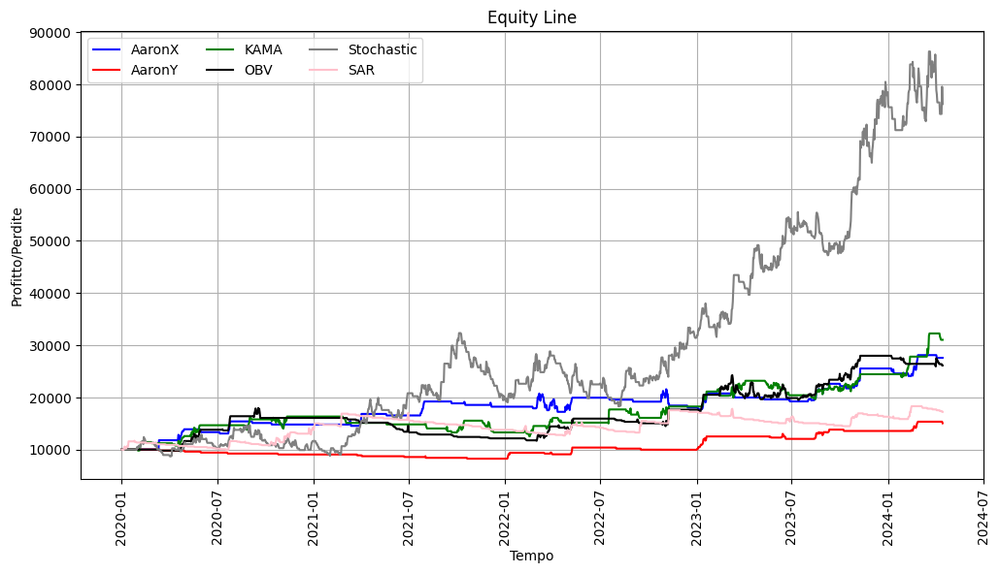

In [13]:
plot_equity(
    ('AaronX', db_statsX['RIT_CUM']),
    ('AaronY', db_statsY['RIT_CUM']),
    ('KAMA', db_stats_KAMA['RIT_CUM']),
    ('OBV', db_stats_obv['RIT_CUM']),
    ('Stochastic', db_stats_stoch['RIT_CUM']),
    ('SAR', db_stats_sar['RIT_CUM']),
    colors=(
        'blue', 'red', 'green', 'black', 'gray', 'pink'
    )
)

In [14]:
strategies_df = pd.DataFrame({
    'X': db_statsX['RIT_CUM'].pct_change().dropna(),
    'Y': db_statsY['RIT_CUM'].pct_change().dropna(),
    'KAMA': db_stats_KAMA['RIT_CUM'].pct_change().dropna(),
    'OBV': db_stats_obv['RIT_CUM'].pct_change().dropna(),
    'Stoch': db_stats_stoch['RIT_CUM'].pct_change().dropna(),
    'SAR': db_stats_sar['RIT_CUM'].pct_change().dropna()
})

In [15]:
quarterly_returns = strategies_df.resample('Q').apply(lambda x: (x + 1).prod() - 1)
annualized_returns = ((quarterly_returns + 1) ** 4) - 1
grouped_quarterly = strategies_df.groupby(pd.Grouper(freq='Q'))
quarterly_volatility = grouped_quarterly.std()
annualized_volatility = quarterly_volatility * np.sqrt(4)
quarterly_correlation_matrices = grouped_quarterly.corr()
quarter_ends = quarterly_correlation_matrices.index.get_level_values(0).unique()
optimized_weights_per_quarter = optimize_portfolio(annualized_returns, annualized_volatility, quarterly_correlation_matrices)

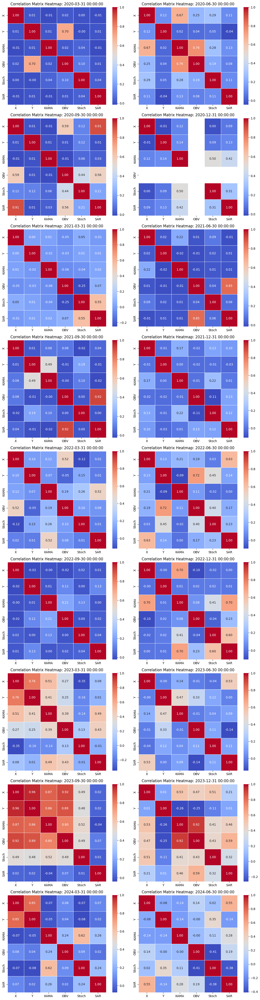

In [16]:
num_rows = int(np.ceil(len(quarter_ends) / 2))
fig, axes = plt.subplots(nrows=num_rows, ncols=2, figsize=(12, num_rows * 5))
axes = axes.flatten()
for i, quarter_end in enumerate(quarter_ends):
    quarter_matrix = quarterly_correlation_matrices.loc[quarter_end]
    sns.heatmap(quarter_matrix, annot=True, cmap='coolwarm', linewidths=.5, fmt=".2f", ax=axes[i])
    axes[i].set_title(f'Correlation Matrix Heatmap: {quarter_end}')

if len(quarter_ends) % 2 != 0:
    axes[-1].axis('off')
plt.tight_layout()
plt.show()

In [17]:
quarters = db.resample('Q').indices
current_capital = 10000
strategy_performance = pd.DataFrame(index=db.index)

In [18]:
for quarter_end, indices in quarters.items():
    quarter_dates = db.index[indices]
    quarter_start = quarter_dates[0]
    quarter_end = quarter_dates[-1]
    quarter_db = db.loc[quarter_start:quarter_end]
    weights = optimized_weights_per_quarter.get(quarter_end, np.ones(6) / 6)
    strategies_info = [
        (strategy_AROON_Xcross(quarter_db, n=35), weights[0], -2, 18),
        (strategy_AROON_Ycross(quarter_db, n=50, livello=50), weights[1], -2, 16),
        (strategy_KAMA(quarter_db, n=30, f=3, l=30), weights[2], -2, 17),
        (strategy_OBV(quarter_db, n=50), weights[3], -1, 20),
        (strategy_Stocastico(quarter_db, k=14), weights[4], -3, 18),
        (strategy_PSAR(quarter_db), weights[5], -1, 17)
    ]
    strategy_names = ['X', 'Y', 'KAMA', 'OBV', 'Stoch', 'SAR']
    profit_loss_list = []
    for (strategy, weight, sl, tp), name in zip(strategies_info, strategy_names):
        db_stats = run_backtest(strategy, weight * current_capital, sl, tp)
        profit_loss = db_stats['RIT_CUM'].iloc[-1] - (weight * current_capital)
        profit_loss_list.append(profit_loss)
        if name in strategy_performance.columns:
            strategy_performance.loc[db_stats.index, name] = db_stats['RIT_CUM']
        else:
            strategy_performance[name] = pd.Series(data=db_stats['RIT_CUM'], index=db_stats.index)
    
    current_capital += sum(profit_loss_list)

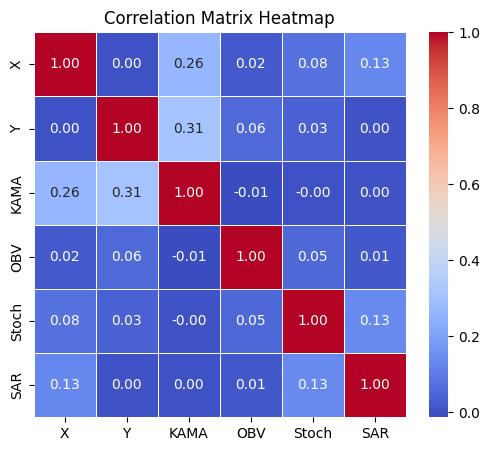

In [19]:
daily_returns = strategy_performance.pct_change().dropna()
correlation_matrix = daily_returns.corr()
plt.figure(figsize=(6, 5))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5, fmt=".2f")
plt.title('Correlation Matrix Heatmap')
plt.show()

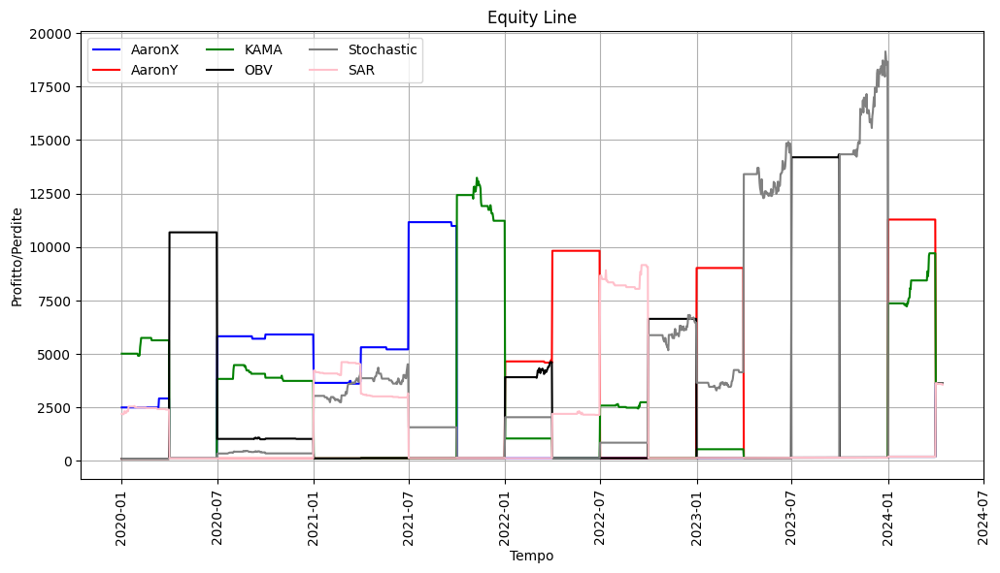

In [20]:
plot_equity(
    ('AaronX', strategy_performance['X']),
    ('AaronY', strategy_performance['Y']),
    ('KAMA', strategy_performance['KAMA']),
    ('OBV', strategy_performance['OBV']),
    ('Stochastic', strategy_performance['Stoch']),
    ('SAR', strategy_performance['SAR']),
    colors=(
        'blue', 'red', 'green', 'black', 'gray', 'pink'
    )
)

In [21]:
strategy_performance['Portfolio'] = strategy_performance.sum(axis=1)
strategy_performance.head()

,X,Y,KAMA,OBV,Stoch,SAR,Portfolio
Date,,,,,,,
2020-01-01,2495.6012,100.0,5011.173284,100.0,100.0,2193.225516,10000.000000
2020-01-02,2495.6012,100.0,5011.173284,100.0,100.0,2193.225516,10000.000000
2020-01-03,2495.6012,100.0,5011.173284,100.0,100.0,2193.225516,10000.000000
2020-01-04,2495.6012,100.0,5011.173284,100.0,100.0,2171.758316,9978.532800
2020-01-05,2495.6012,100.0,5011.173284,100.0,100.0,2191.033218,9997.807702


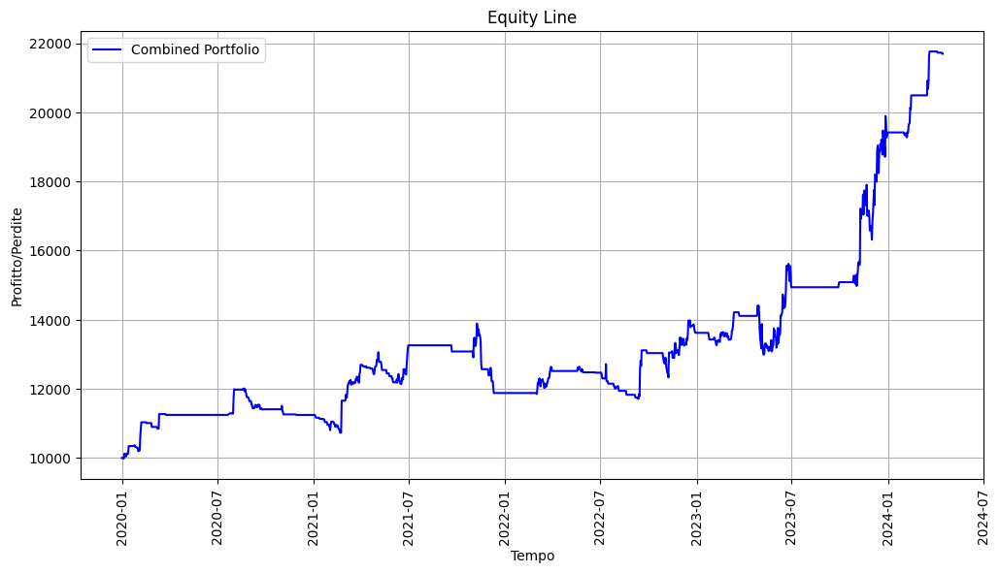

In [22]:
plot_equity(
    ('Combined Portfolio', strategy_performance['Portfolio']),
    colors=(
        'blue'
    )
)

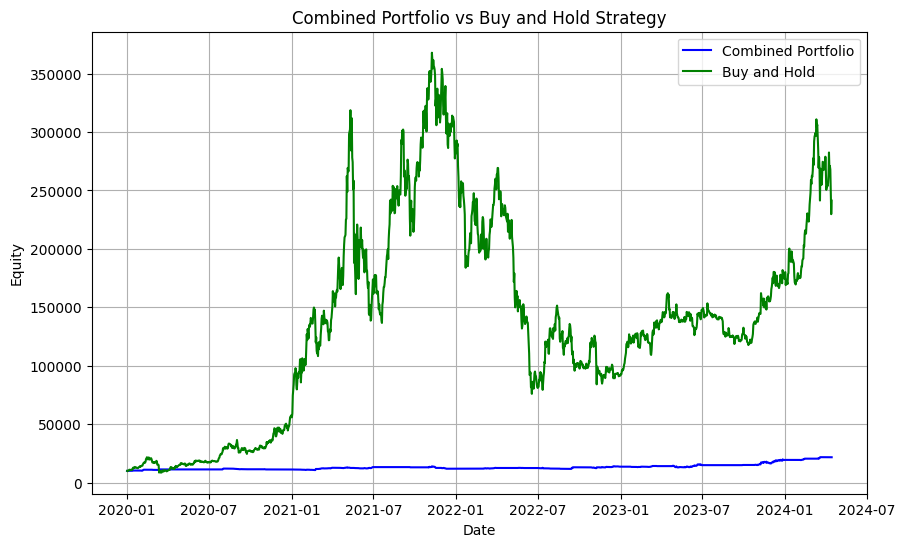

In [23]:
close_prices = db['close']
buy_and_hold_equity = initial_capital * (close_prices / close_prices.iloc[0])
strategy_performance['Buy and Hold'] = buy_and_hold_equity
plt.figure(figsize=(10, 6))
plt.plot(strategy_performance.index, strategy_performance['Portfolio'], label='Combined Portfolio', color='blue')
plt.plot(strategy_performance.index, strategy_performance['Buy and Hold'], label='Buy and Hold', color='green')
plt.xlabel('Date')
plt.ylabel('Equity')
plt.title('Combined Portfolio vs Buy and Hold Strategy')
plt.legend()
plt.grid(True)
plt.show()

In [24]:
strategy_performance['Daily Return'] = strategy_performance['Portfolio'].pct_change()
strategy_performance['Buy and Hold Daily Return'] = strategy_performance['Buy and Hold'].pct_change()
total_return = strategy_performance['Portfolio'][-1] / strategy_performance['Portfolio'][0] - 1
buy_and_hold_total_return = strategy_performance['Buy and Hold'][-1] / strategy_performance['Buy and Hold'][0] - 1
years = len(strategy_performance) / 365
annualized_return = (total_return / years) * 100
buy_and_hold_annualized_return = (buy_and_hold_total_return / years) * 100
annualized_volatility = np.std(strategy_performance['Daily Return']) * np.sqrt(365)
buy_and_hold_annualized_volatility = np.std(strategy_performance['Buy and Hold Daily Return']) * np.sqrt(365)
risk_free_rate = 0
sharpe_ratio = (annualized_return - risk_free_rate) / annualized_volatility
buy_and_hold_sharpe_ratio = (buy_and_hold_annualized_return - risk_free_rate) / buy_and_hold_annualized_volatility
cumulative_returns = (1 + strategy_performance['Daily Return']).cumprod()
buy_and_hold_cumulative_returns = (1 + strategy_performance['Buy and Hold Daily Return']).cumprod()
peak = cumulative_returns.expanding(min_periods=1).max()
buy_and_hold_peak = buy_and_hold_cumulative_returns.expanding(min_periods=1).max()
drawdown = (cumulative_returns - peak) / peak
buy_and_hold_drawdown = (buy_and_hold_cumulative_returns - buy_and_hold_peak) / buy_and_hold_peak
max_drawdown_percentage = drawdown.min() * 100
buy_and_hold_max_drawdown_percentage = buy_and_hold_drawdown.min() * 100

print("Annualized Return: {:.2f}%".format(annualized_return))
print("Buy and Hold Annualized Return: {:.2f}%".format(buy_and_hold_annualized_return))
print("Annualized Volatility: {:.2f}%".format(annualized_volatility * 100))
print("Buy and Hold Annualized Volatility: {:.2f}%".format(buy_and_hold_annualized_volatility * 100))
print("Sharpe Ratio: {:.2f}".format(sharpe_ratio/100))
print("Buy and Hold Sharpe Ratio: {:.2f}".format(buy_and_hold_sharpe_ratio/100))
print("Maximum Drawdown Percentage: {:.2f}%".format(max_drawdown_percentage))
print("Buy and Hold Maximum Drawdown Percentage: {:.2f}%".format(buy_and_hold_max_drawdown_percentage))

Annualized Return: 27.26%
Buy and Hold Annualized Return: 539.23%
Annualized Volatility: 16.51%
Buy and Hold Annualized Volatility: 85.51%
Sharpe Ratio: 1.65
Buy and Hold Sharpe Ratio: 6.31
Maximum Drawdown Percentage: -15.68%
Buy and Hold Maximum Drawdown Percentage: -79.35%


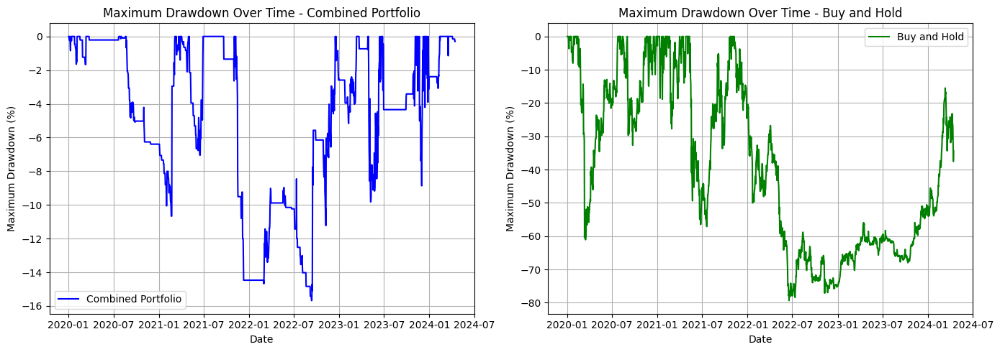

In [25]:
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.plot(strategy_performance.index, drawdown * 100, label='Combined Portfolio', color='blue')
plt.xlabel('Date')
plt.ylabel('Maximum Drawdown (%)')
plt.title('Maximum Drawdown Over Time - Combined Portfolio')
plt.legend()
plt.grid(True)
plt.subplot(1, 2, 2)
plt.plot(strategy_performance.index, buy_and_hold_drawdown * 100, label='Buy and Hold', color='green')
plt.xlabel('Date')
plt.ylabel('Maximum Drawdown (%)')
plt.title('Maximum Drawdown Over Time - Buy and Hold')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Fixed Weights Portfolio

In [26]:
initial_capital=10000/6

In [27]:
db_strategiaX= strategy_AROON_Xcross(db, n=35)
db_strategiaY= strategy_AROON_Ycross(db,n=50, livello=50)
db_strategia_KAMA= strategy_KAMA(db,n=30,f=3,l=30)
db_strategia_obv= strategy_OBV(db, n=50)
db_strategia_stoch= strategy_Stocastico(db, k=14)
db_strategia_sar= strategy_PSAR(db)
db_statsX=run_backtest(db_strategiaX, initial_capital, sl=-2, tp=18)
db_statsY=run_backtest(db_strategiaY, initial_capital, sl=-2, tp=16)
db_stats_KAMA=run_backtest(db_strategia_KAMA, initial_capital, sl=-2, tp=17)
db_stats_obv=run_backtest(db_strategia_obv, initial_capital, sl=-1, tp=20)
db_stats_stoch=run_backtest(db_strategia_stoch, initial_capital, sl=-3, tp=18)
db_stats_sar=run_backtest(db_strategia_sar, initial_capital, sl=-1, tp=17)
report_ax = report(db_statsX,db_statsX['P&L'],db_statsX['RIT_CUM'])
report_ay = report(db_statsY,db_statsY['P&L'],db_statsY['RIT_CUM'])
report_kama = report(db_stats_KAMA,db_stats_KAMA['P&L'],db_stats_KAMA['RIT_CUM'])
report_obv = report(db_stats_obv,db_stats_obv['P&L'],db_stats_obv['RIT_CUM'])
report_stoch = report(db_stats_stoch,db_stats_stoch['P&L'],db_stats_stoch['RIT_CUM'])
report_sar = report(db_stats_sar,db_stats_sar['P&L'],db_stats_sar['RIT_CUM'])
df_report = pd.DataFrame([report_ax, report_ay, report_kama, report_obv, report_stoch, report_sar], index=['Aaron X', 'AaronY', 'KAMA', 'OBV', 'Stochastic', 'SAR'])

df_report

,Ritorno Ann,Volatilità Ann,Profitto,Profitto Buy&Hold,Operazioni Chiuse,Operazioni Long,Operazioni Short,Rendimento Medio,Rendimento Medio %,Dev. Std Rend. Med,Profit Factor,Profitto Lordo,Perdita Lorda,% Trade Vincenti,% Trade Perdenti,Reward Risk Ratio,Guadagno Massimo,Guadagno Massimo Data,Guadagno Medio,Guadagno % Medio,Dev. Std Guadagni,Perdita Massima,Perdita Massima Data,Perdita Media,Perdita % Media,Dev. Std Perdite,Avg Draw Down,Max Draw Down,Max Draw Down %,Sharpe Ratio,Sharpe Ratio B&H,VaR Historic,CVaR Historic,Sortino Ratio,Calmar Ratio,Burke Ratio,Modified Burke Ratio
Aaron X,20.08,15.24,1985.0,38907.0,39,19,20,51.0,3.45,9.41,2.76,3116.0,-1131.0,23.08,76.92,9.19,500.0,2024-02-27,346.0,19.19,1.91,-66.0,2024-04-03,-45.0,-1.98,0.02,-122.0,-358.0,-12.0,1.32,1.29,-0.00,0.06,0.95,1.67,0.13,4.96
AaronY,0.94,6.08,68.0,38907.0,24,12,12,3.0,2.64,8.35,1.25,345.0,-277.0,8.33,91.67,13.71,225.0,2023-01-20,172.0,16.52,3.54,-36.0,2023-05-23,-31.0,-1.98,0.02,-137.0,-178.0,-11.0,0.15,1.29,-0.00,0.02,0.05,0.09,0.00,0.12
KAMA,19.01,18.07,1848.0,38907.0,85,42,43,22.0,1.76,7.56,2.23,3345.0,-1497.0,14.12,85.88,13.60,385.0,2024-02-12,279.0,17.19,2.47,-70.0,2024-04-11,-33.0,-1.81,0.46,-135.0,-320.0,-12.0,1.05,1.29,0.93,1.99,0.92,1.58,0.11,4.41
OBV,16.44,16.66,1534.0,38907.0,108,58,59,12.0,1.05,6.34,2.12,2494.0,-1175.0,9.26,90.74,20.80,420.0,2020-07-26,249.0,15.95,9.22,-25.0,2023-01-06,-19.0,-0.99,0.00,-380.0,-751.0,-26.0,0.99,1.29,0.70,1.71,0.78,0.63,0.03,1.23
Stochastic,49.27,41.45,7617.0,38907.0,281,152,152,22.0,0.97,7.37,1.45,20174.0,-13878.0,22.78,77.22,4.93,1433.0,2024-03-19,315.0,10.97,7.94,-276.0,2024-01-02,-83.0,-2.74,0.62,-452.0,-1266.0,-36.0,1.19,1.29,2.90,4.08,1.84,1.37,0.09,3.42
SAR,14.25,17.55,1284.0,38907.0,123,62,63,9.0,0.58,5.34,1.74,2665.0,-1529.0,7.32,92.68,22.08,411.0,2024-02-15,296.0,18.39,1.80,-26.0,2022-12-01,-18.0,-0.99,0.00,-192.0,-470.0,-17.0,0.81,1.29,0.79,1.47,0.89,0.84,0.04,1.78


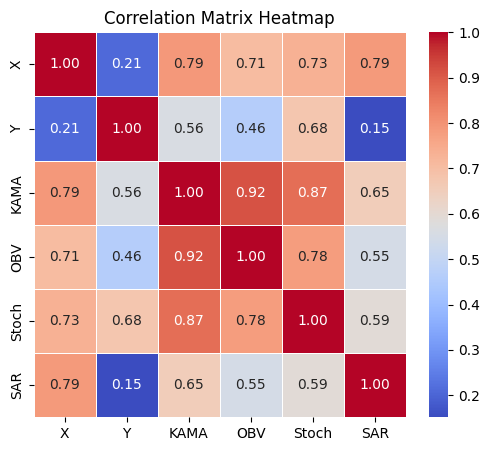

In [28]:
strategies_df = pd.DataFrame({
    'X': db_statsX['RIT_CUM'],
    'Y': db_statsY['RIT_CUM'],
    'KAMA': db_stats_KAMA['RIT_CUM'],
    'OBV': db_stats_obv['RIT_CUM'],
    'Stoch': db_stats_stoch['RIT_CUM'],
    'SAR': db_stats_sar['RIT_CUM']
})
correlation_matrix = strategies_df.corr()

plt.figure(figsize=(6, 5))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5, fmt=".2f")
plt.title('Correlation Matrix Heatmap')
plt.show()

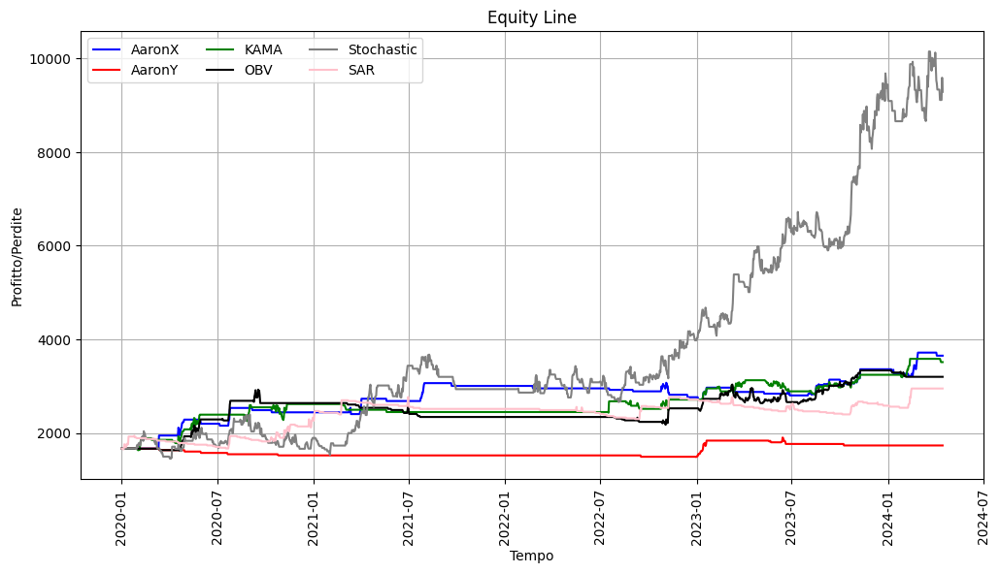

In [29]:
plot_equity(
    ('AaronX', db_statsX['RIT_CUM']),
    ('AaronY', db_statsY['RIT_CUM']),
    ('KAMA', db_stats_KAMA['RIT_CUM']),
    ('OBV', db_stats_obv['RIT_CUM']),
    ('Stochastic', db_stats_stoch['RIT_CUM']),
    ('SAR', db_stats_sar['RIT_CUM']),
    colors=(
        'blue', 'red', 'green', 'black', 'gray', 'pink'
    )
)

In [30]:
combined_portfolio = db_statsX[['RIT_CUM']].copy()
combined_portfolio['AaronX'] = db_statsX['RIT_CUM']
combined_portfolio['AaronY'] = db_statsY['RIT_CUM']
combined_portfolio['KAMA'] = db_stats_KAMA['RIT_CUM']
combined_portfolio['OBV'] = db_stats_obv['RIT_CUM']
combined_portfolio['Stoch'] = db_stats_stoch['RIT_CUM']
combined_portfolio['SAR'] = db_stats_sar['RIT_CUM']
combined_portfolio['Portfolio'] = (
    db_statsX['RIT_CUM'] +
    db_statsY['RIT_CUM'] +
    db_stats_KAMA['RIT_CUM'] +
    db_stats_obv['RIT_CUM'] +
    db_stats_stoch['RIT_CUM'] +
    db_stats_sar['RIT_CUM']
)
combined_portfolio.set_index(db_statsX.index, inplace=True)
combined_portfolio.drop(columns=['RIT_CUM'], inplace=True)

combined_portfolio.tail()

,AaronX,AaronY,KAMA,OBV,Stoch,SAR,Portfolio
Date,,,,,,,
2024-04-10,3652.078567,1734.820894,3546.442343,3200.636265,9112.129561,2951.10553,24197.213159
2024-04-11,3652.078567,1734.820894,3514.920298,3200.636265,9112.129561,2951.10553,24165.691114
2024-04-12,3652.078567,1734.820894,3514.920298,3200.636265,9112.129561,2951.10553,24165.691114
2024-04-13,3652.078567,1734.820894,3514.920298,3200.636265,9588.210615,2951.10553,24641.772169
2024-04-14,3652.078567,1734.820894,3514.920298,3200.636265,9284.127608,2951.10553,24337.689161


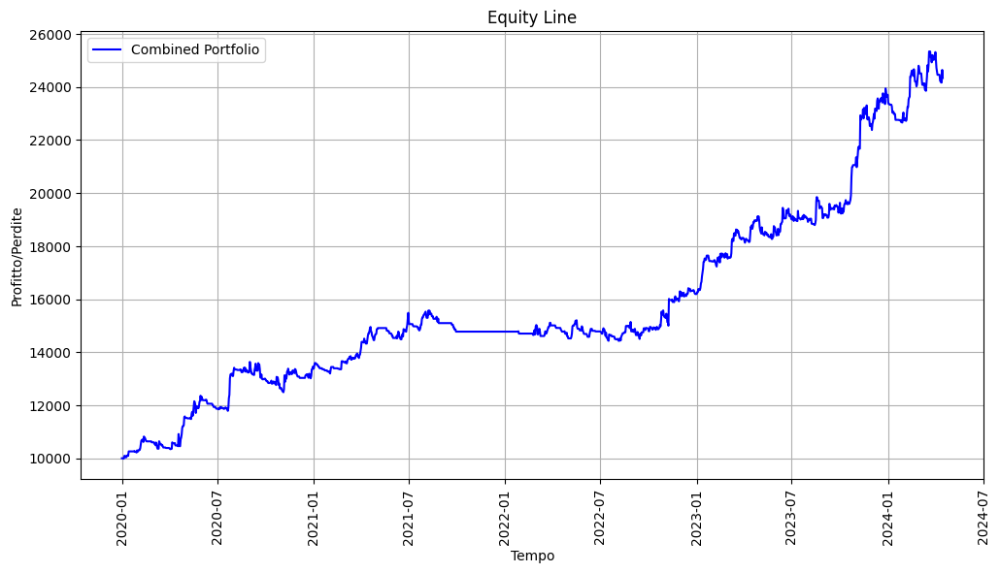

In [31]:
plot_equity(
    ('Combined Portfolio', combined_portfolio['Portfolio']),
    colors=(
        'blue'
    )
)

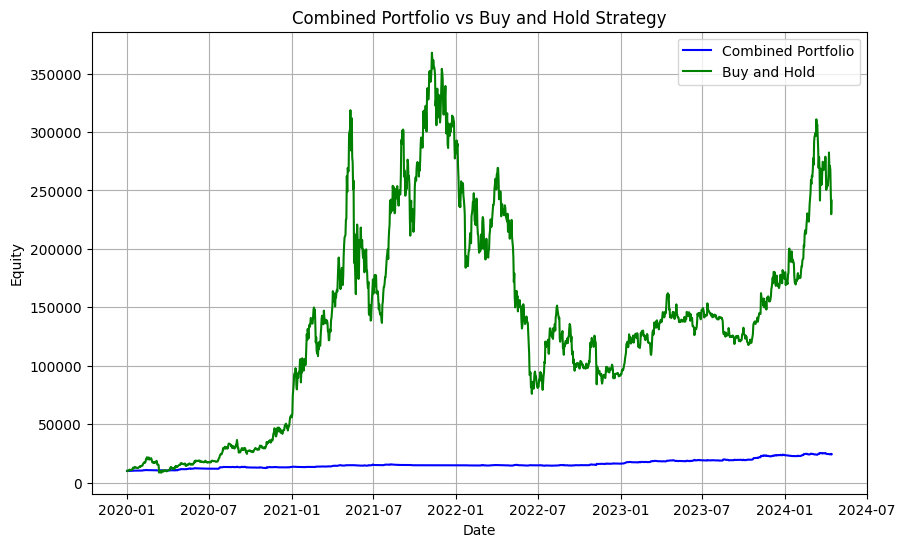

In [32]:
initial_capital = 10000
close_prices = db['close']
buy_and_hold_equity = initial_capital * (close_prices / close_prices.iloc[0])
combined_portfolio['Buy and Hold'] = buy_and_hold_equity
plt.figure(figsize=(10, 6))
plt.plot(combined_portfolio.index, combined_portfolio['Portfolio'], label='Combined Portfolio', color='blue')
plt.plot(combined_portfolio.index, combined_portfolio['Buy and Hold'], label='Buy and Hold', color='green')
plt.xlabel('Date')
plt.ylabel('Equity')
plt.title('Combined Portfolio vs Buy and Hold Strategy')
plt.legend()
plt.grid(True)
plt.show()

In [33]:
combined_portfolio['Daily Return'] = combined_portfolio['Portfolio'].pct_change()
combined_portfolio['Buy and Hold Daily Return'] = combined_portfolio['Buy and Hold'].pct_change()
total_return = combined_portfolio['Portfolio'][-1] / combined_portfolio['Portfolio'][0] - 1
buy_and_hold_total_return = combined_portfolio['Buy and Hold'][-1] / combined_portfolio['Buy and Hold'][0] - 1
years = len(combined_portfolio) / 365
annualized_return = (total_return / years) * 100
buy_and_hold_annualized_return = (buy_and_hold_total_return / years) * 100
annualized_volatility = np.std(combined_portfolio['Daily Return']) * np.sqrt(365)
buy_and_hold_annualized_volatility = np.std(combined_portfolio['Buy and Hold Daily Return']) * np.sqrt(365)
risk_free_rate = 0
sharpe_ratio = (annualized_return - risk_free_rate) / annualized_volatility
buy_and_hold_sharpe_ratio = (buy_and_hold_annualized_return - risk_free_rate) / buy_and_hold_annualized_volatility
cumulative_returns = (1 + combined_portfolio['Daily Return']).cumprod()
buy_and_hold_cumulative_returns = (1 + combined_portfolio['Buy and Hold Daily Return']).cumprod()
peak = cumulative_returns.expanding(min_periods=1).max()
buy_and_hold_peak = buy_and_hold_cumulative_returns.expanding(min_periods=1).max()
drawdown = (cumulative_returns - peak) / peak
buy_and_hold_drawdown = (buy_and_hold_cumulative_returns - buy_and_hold_peak) / buy_and_hold_peak
max_drawdown_percentage = drawdown.min() * 100
buy_and_hold_max_drawdown_percentage = buy_and_hold_drawdown.min() * 100

print("Annualized Return: {:.2f}%".format(annualized_return))
print("Buy and Hold Annualized Return: {:.2f}%".format(buy_and_hold_annualized_return))
print("Annualized Volatility: {:.2f}%".format(annualized_volatility * 100))
print("Buy and Hold Annualized Volatility: {:.2f}%".format(buy_and_hold_annualized_volatility * 100))
print("Sharpe Ratio: {:.2f}".format(sharpe_ratio/100))
print("Buy and Hold Sharpe Ratio: {:.2f}".format(buy_and_hold_sharpe_ratio/100))
print("Maximum Drawdown Percentage: {:.2f}%".format(max_drawdown_percentage))
print("Buy and Hold Maximum Drawdown Percentage: {:.2f}%".format(buy_and_hold_max_drawdown_percentage))

Annualized Return: 33.42%
Buy and Hold Annualized Return: 539.23%
Annualized Volatility: 13.15%
Buy and Hold Annualized Volatility: 85.51%
Sharpe Ratio: 2.54
Buy and Hold Sharpe Ratio: 6.31
Maximum Drawdown Percentage: -8.39%
Buy and Hold Maximum Drawdown Percentage: -79.35%


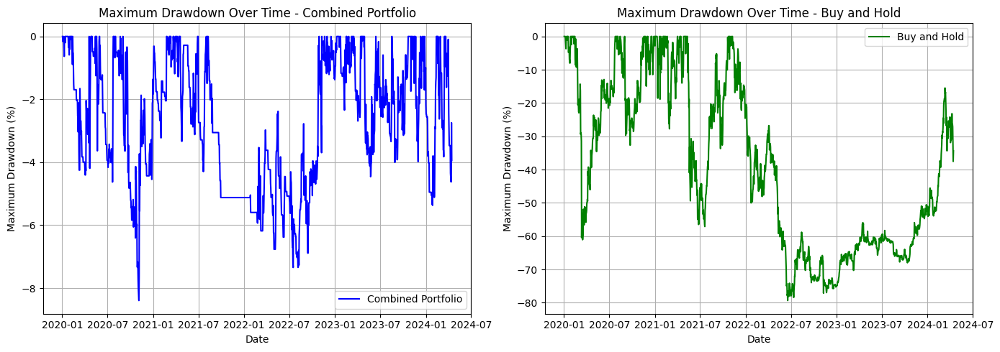

In [34]:
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.plot(combined_portfolio.index, drawdown * 100, label='Combined Portfolio', color='blue')
plt.xlabel('Date')
plt.ylabel('Maximum Drawdown (%)')
plt.title('Maximum Drawdown Over Time - Combined Portfolio')
plt.legend()
plt.grid(True)
plt.subplot(1, 2, 2)
plt.plot(combined_portfolio.index, buy_and_hold_drawdown * 100, label='Buy and Hold', color='green')
plt.xlabel('Date')
plt.ylabel('Maximum Drawdown (%)')
plt.title('Maximum Drawdown Over Time - Buy and Hold')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()